In [1]:
import sys
path_to_pip_installs = "/tmp/test_env"
if path_to_pip_installs not in sys.path:
    sys.path.insert(0, path_to_pip_installs)

path = "/home/students/studweilc1/MU-Diff/"
# add this to path for imports
if path not in sys.path:
    sys.path.append(path)

In [2]:
import voxelmorph as vxm
import tqdm
import numpy as np
import torch
import neurite as ne
import matplotlib.pyplot as plt

# import SpatialTransformer
from voxelmorph.nn.modules import SpatialTransformer

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np



In [3]:
def draw_perlin(
    out_shape,
    scales,
    min_std=0,
    max_std=1,
    dtype=torch.float32,
    seed=None,
    device=None
):
    """
    Generate Perlin-like noise in PyTorch by summing Gaussian noise at different scales.

    This function is a PyTorch translation of the provided TensorFlow version.
    It samples noise at different resolutions (defined by scales), upsamples it to the
    target output shape, and accumulates it.

    Parameters:
        out_shape (tuple or list): The desired output shape. For N-dimensional spatial
            data, this should have N+1 elements, with the last being the channel/feature
            dimension (e.g., [H, W, C]).
        scales (list or int): A list of relative resolutions for noise sampling. A scale
            of 2 means sampling at half the output resolution.
        min_std (float): Minimum standard deviation for the Gaussian noise.
        max_std (float): Maximum standard deviation for the Gaussian noise.
        dtype (torch.dtype): The data type for the output tensor.
        seed (int, optional): A seed for reproducible randomization.
        device (str or torch.device, optional): The device (e.g., 'cpu' or 'cuda')
            on which to create the tensor.
    """
    if seed is not None:
        torch.manual_seed(seed)

    out_shape = np.asarray(out_shape, dtype=np.int32)
    if np.isscalar(scales):
        scales = [scales]

    # Get the number of spatial dimensions (e.g., 2 for [H, W, C]).
    n_dims = len(out_shape) - 1

    # Initialize the output tensor with zeros.
    out = torch.zeros(*out_shape, dtype=dtype, device=device)

    for scale in scales:
        # 1. Calculate the shape of the low-resolution noise.
        sample_shape = np.ceil(out_shape[:-1] / scale)
        sample_shape = tuple(np.int32((*sample_shape, out_shape[-1])))

        # 2. Draw a random standard deviation.
        std = (torch.rand(1, dtype=dtype, device=device) * (max_std - min_std)) + min_std

        # 3. Generate the low-resolution Gaussian noise.
        gauss = torch.randn(*sample_shape, dtype=dtype, device=device) * std

        if scale == 1:
            # If scale is 1, the shape already matches, so no resize is needed.
            out += gauss
        else:
            # 4. Upsample the noise to the full output shape.
            
            # Reshape for torch.nn.functional.interpolate:
            # It expects (B, C, H, W, ...). We move the channel dim to the front
            # and add a batch dimension of 1.
            # e.g., from (H, W, C) to (1, C, H, W).
            gauss_reshaped = gauss.permute(n_dims, *range(n_dims)).unsqueeze(0)

            # Define the target spatial shape for upsampling.
            target_spatial_shape = tuple(out_shape[:-1])

            # Choose interpolation mode based on dimensionality.
            if n_dims == 1:
                mode = 'linear'
            elif n_dims == 2:
                mode = 'bilinear'
            elif n_dims == 3:
                mode = 'trilinear'
            else:
                # 'nearest' is a safe fallback for dimensions > 3.
                mode = 'nearest'

            # Perform the upsampling.
            upsampled = F.interpolate(
                gauss_reshaped,
                size=target_spatial_shape,
                mode=mode,
                align_corners=False if mode != 'nearest' else None
            )

            # Reshape back to the original layout:
            # e.g., from (1, C, H, W) to (H, W, C).
            upsampled_reshaped = upsampled.squeeze(0).permute(*range(1, n_dims + 1), 0)

            out += upsampled_reshaped

    return out

Generating base label maps...


100%|██████████| 40/40 [00:01<00:00, 23.22it/s]


Done.


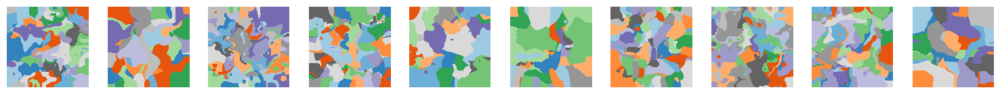

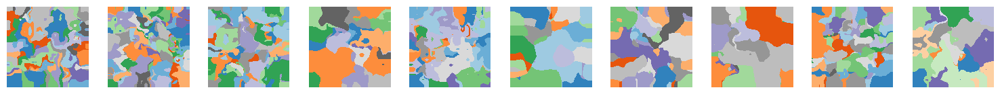

In [4]:



# --- 1. Generate Base Label Maps ---
in_shape = (256, 256)
num_dim = len(in_shape)
num_label = 16
num_maps = 40

print('Generating base label maps...')
label_maps = []
for _ in tqdm.tqdm(range(num_maps)):
    # Draw image and warp using neurite (framework-agnostic)
    im = draw_perlin(
        out_shape=(*in_shape, num_label),
        scales=(32, 64), max_std=1,
    )
    warp = draw_perlin(
        out_shape=(*in_shape, num_label, num_dim),
        scales=(16, 32, 64), max_std=16,
    )

    # Transform and create label map using voxelmorph and torch
    im_tensor = im.float().permute(2, 0, 1).unsqueeze(0) # [1, C, H, W]
    warp_tensor = warp.float().permute(2, 3, 0, 1) # [C, D, H, W] -> needs adjustment

    # For simplicity, we apply the same warp to all channels then find the argmax
    # This is slightly different from the TF implementation but achieves the same goal
    transform_layer = SpatialTransformer(in_shape)
    im_warped = transform_layer(im_tensor, warp[...,0,:].float().permute(2,0,1).unsqueeze(0))
    lab = torch.argmax(im_warped, dim=1).squeeze().numpy()
    label_maps.append(np.uint8(lab))

print('Done.')
# Visualize shapes (same as original)
num_row = 2
per_row = 10
for i in range(0, num_row * per_row, per_row):
  ne.plot.slices([l for l in label_maps[i:i + per_row]], cmaps=['tab20c'])

In [5]:
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter

def labels_to_image_pytorch(label_map, num_label, in_shape, warp_max=4):
    """
    PyTorch implementation of the labels_to_image logic.
    """
    # Ensure label_map is a tensor
    if isinstance(label_map, np.ndarray):
        label_map = torch.from_numpy(label_map).float()

    # Add batch and channel dimensions if needed
    if len(label_map.shape) == 2:
        label_map = label_map.unsqueeze(0).unsqueeze(0)
    elif len(label_map.shape) == 3:
        label_map = label_map.unsqueeze(1)
        
    # --- 1. Warp the labels ---
    # Create a random smooth warp field
    warp = draw_perlin(
        out_shape=(1, *in_shape, num_dim),
        scales=(16, 32), max_std=warp_max,
    )
    warp_tensor = warp.float().permute(0, 3, 1, 2) # [B, D, H, W]

    # Apply warp
    transform_layer = vxm.nn.modules.SpatialTransformer(in_shape)
    warped_label_map = transform_layer(label_map, warp_tensor)

    # --- 2. Create synthetic image from warped labels ---
    # One-hot encode the warped labels
    # Use nearest neighbor interpolation to keep labels discrete
    warped_one_hot = F.one_hot(warped_label_map.long().squeeze(1), num_classes=num_label).permute(0, 3, 1, 2).float()

    # --- 3. Synthesize intensities and blur ---
    # Assign random intensities to each label
    rand_intensities = torch.rand(1, num_label, 1, 1) * 0.8 + 0.1
    image = torch.sum(warped_one_hot * rand_intensities, dim=1, keepdim=True)
    
    # Apply Gaussian blur
    # Using scipy for simplicity, but a PyTorch conv could also be used.
    image_np = image.squeeze(0).squeeze(0).numpy()
    image_np = gaussian_filter(image_np, sigma=np.random.uniform(1, 3))
    image = torch.from_numpy(image_np).unsqueeze(0).unsqueeze(0).float()
    
    # Add noise
    noise = torch.randn(*image.shape) * np.random.uniform(0, 0.05)
    image += noise
    
    return image, warped_one_hot

In [6]:


class ConvBlock(nn.Module):
    """
    A convolutional block consisting of a convolution, activation, and optional batch normalization.
    """
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.activation = nn.LeakyReLU(0.2)

    def forward(self, x):
        return self.activation(self.conv(x))

class Unet(nn.Module):
    """
    A U-Net architecture for image-to-image translation.
    This is a simplified version of the U-Net from the original VoxelMorph code.
    """
    def __init__(self, in_channels=2, nb_features=None):
        super().__init__()
        
        enc_nf, dec_nf = nb_features
        self.in_channels = in_channels
        
        # Encoder (downsampling path)
        self.pool = nn.MaxPool2d(2, 2)
        self.encoders = nn.ModuleList([
            ConvBlock(in_channels, enc_nf[0]),
            ConvBlock(enc_nf[0], enc_nf[1]),
            ConvBlock(enc_nf[1], enc_nf[2]),
            ConvBlock(enc_nf[2], enc_nf[3])
        ])
        
        # Decoder (upsampling path)
        self.upsamples = nn.ModuleList([
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Upsample(scale_factor=2, mode='nearest')
        ])
        
        self.decoders = nn.ModuleList([
            ConvBlock(enc_nf[3] + enc_nf[2], dec_nf[0]),
            ConvBlock(dec_nf[0] + enc_nf[1], dec_nf[1]),
            ConvBlock(dec_nf[1] + enc_nf[0], dec_nf[2]),
            # Final layers
            ConvBlock(dec_nf[2], dec_nf[3]),
            ConvBlock(dec_nf[3], dec_nf[4]),
            ConvBlock(dec_nf[4], dec_nf[5]),
            ConvBlock(dec_nf[5], dec_nf[6]),
            ConvBlock(dec_nf[6], dec_nf[7])
        ])

    def forward(self, x):
        # Encoder path
        skip_connections = []
        
        # Level 1
        x = self.encoders[0](x)
        skip_connections.append(x)
        x = self.pool(x)
        
        # Level 2
        x = self.encoders[1](x)
        skip_connections.append(x)
        x = self.pool(x)
        
        # Level 3
        x = self.encoders[2](x)
        skip_connections.append(x)
        x = self.pool(x)
        
        # Bottleneck
        x = self.encoders[3](x)

        # --- Decoder path (Corrected Logic) ---
        
        # Level 3 up
        x = self.upsamples[0](x)
        x = torch.cat([x, skip_connections.pop()], dim=1)
        x = self.decoders[0](x)
        
        # Level 2 up
        x = self.upsamples[1](x)
        x = torch.cat([x, skip_connections.pop()], dim=1)
        x = self.decoders[1](x)
        
        # Level 1 up
        x = self.upsamples[2](x)
        x = torch.cat([x, skip_connections.pop()], dim=1)
        x = self.decoders[2](x)
        
        # Final convolutions at full resolution
        x = self.decoders[3](x)
        x = self.decoders[4](x)
        x = self.decoders[5](x)
        x = self.decoders[6](x)
        x = self.decoders[7](x)
                
        return x

class VecInt(nn.Module):
    """
    Integrates a stationary velocity field (SVF) using the scaling and squaring method.
    """
    def __init__(self, in_shape, n_steps=7):
        super().__init__()
        assert n_steps >= 0, 'n_steps must be >= 0'
        self.n_steps = n_steps
        self.scale = 1.0 / (2**self.n_steps)
        self.transformer = SpatialTransformer(in_shape)

    def forward(self, vel):
        flow = vel * self.scale
        for _ in range(self.n_steps):
            # The second argument to transformer is the flow field
            flow = flow + self.transformer(flow, flow)
        return flow

class VxmDense(nn.Module):
    """
    VoxelMorph network for (unsupervised) nonlinear registration between two images.
    This is a PyTorch port of the core VxmDense TensorFlow model.
    """
    def __init__(self, in_shape, nb_unet_features, int_steps=7, int_resolution=2):
        super().__init__()
        
        self.in_shape = in_shape
        self.int_steps = int_steps
        self.int_resolution = int_resolution
        ndims = len(in_shape)
        
        # U-Net backbone
        self.unet = Unet(in_channels=2, nb_features=nb_unet_features)

        # Final convolution to get the flow field (SVF)
        self.flow_conv = nn.Conv2d(nb_unet_features[-1][-1], ndims, kernel_size=3, padding=1)
        # Initialize the flow convolution with small weights to start with an identity transform
        self.flow_conv.weight = nn.Parameter(torch.randn_like(self.flow_conv.weight) * 1e-5)
        self.flow_conv.bias = nn.Parameter(torch.zeros_like(self.flow_conv.bias))

        # Vector integration layer to create the diffeomorphic warp
        if self.int_steps > 0:
            # We need to initialize VecInt with the downsampled shape
            down_shape = [dim // int_resolution for dim in in_shape]
            self.vec_int = VecInt(down_shape, self.int_steps)

        # Spatial transformer to apply the warp
        self.transformer = SpatialTransformer(self.in_shape)

    def forward(self, source, target):
        x = torch.cat([source, target], dim=1)
        unet_out = self.unet(x)
        svf = self.flow_conv(unet_out)
        
        if self.int_resolution > 1:
            svf_down = F.interpolate(svf, scale_factor=1./self.int_resolution, mode='bilinear', align_corners=True, recompute_scale_factor=True)
        else:
            svf_down = svf

        if self.int_steps > 0:
            pos_flow = self.vec_int(svf_down)
        else:
            pos_flow = svf_down

        if self.int_resolution > 1:
            pos_flow_full_res = F.interpolate(pos_flow, scale_factor=self.int_resolution, mode='bilinear', align_corners=True, recompute_scale_factor=True)
        else:
            pos_flow_full_res = pos_flow
        
        moved_image = self.transformer(source, pos_flow_full_res)

        # *** THE FIX IS HERE: Return the full-resolution flow field ***
        return moved_image, pos_flow_full_res

In [7]:

model_def = VxmDense(
  in_shape=in_shape,
  nb_unet_features=([256] * 4, [256] * 8),
  int_steps=7, # Corresponds to svf_resolution=2 in TF
  int_resolution=2 # Corresponds to int_resolution=2 in TF
)

In [8]:
import voxelmorph.nn.losses as vxm_losses

# --- Dice Loss for your segmentation task ---
class DiceLoss(torch.nn.Module):
    def __init__(self, smooth=1e-5):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, y_true, y_pred):
        # y_true and y_pred should be one-hot encoded probability maps
        assert y_true.shape == y_pred.shape
        dims = tuple(range(2, len(y_true.shape))) # Sum over spatial dimensions
        
        intersect = torch.sum(y_pred * y_true, dims)
        cardinality = torch.sum(y_pred + y_true, dims)
        
        dice_score = (2. * intersect + self.smooth) / (cardinality + self.smooth)
        return 1. - torch.mean(dice_score)

# --- Loss instances ---
# For your kidney masks, you'll want to use Dice loss.
similarity_loss = DiceLoss() 

# Regularization loss on the warp field
regularization_loss = vxm_losses.Grad('l2', loss_mult=0.05)

In [9]:
regularization_loss.loss(torch.randn(1, 2, 256, 256), torch.randn(1, 2, 256, 256))  # Example usage

tensor(0.1005)

Starting training on cpu...


Epoch 1/3: 100%|██████████| 100/100 [03:14<00:00,  1.95s/it]


Epoch 1/3 - Average Loss: 0.3403


Epoch 2/3: 100%|██████████| 100/100 [03:01<00:00,  1.82s/it]


Epoch 2/3 - Average Loss: 0.3446


Epoch 3/3: 100%|██████████| 100/100 [03:47<00:00,  2.28s/it]

Epoch 3/3 - Average Loss: 0.3393


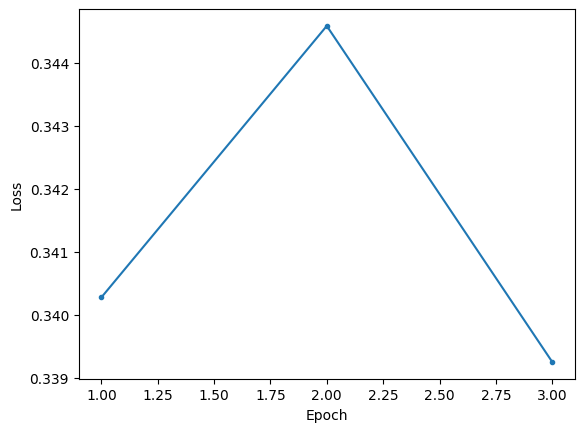

In [10]:
import random

# --- Setup for training ---
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_def.to(device)
optimizer = torch.optim.Adam(model_def.parameters(), lr=1e-4)
epochs = 3
steps_per_epoch = 100
losses = []

print(f'Starting training on {device}...')
for epoch in range(epochs):
    epoch_loss = []
    for step in tqdm.tqdm(range(steps_per_epoch), desc=f'Epoch {epoch+1}/{epochs}'):
        optimizer.zero_grad()

        # --- 1. Generate a synthetic pair on the fly ---
        # Select a random label map as the base
        moving_label = random.choice(label_maps)
        
        # Create two different synthetic images from the same base label map
        fixed_image, fixed_map = labels_to_image_pytorch(moving_label, num_label, in_shape)
        moving_image, moving_map = labels_to_image_pytorch(moving_label, num_label, in_shape)
        
        # Move tensors to the training device
        moving_image = moving_image.to(device).float()
        fixed_image = fixed_image.to(device).float()
        moving_map = moving_map.to(device).float()
        fixed_map = fixed_map.to(device).float()

        # --- 2. Forward pass ---
        moved_image, warp = model_def(moving_image, fixed_image)
        
        # Apply the warp to the moving probability map to get the moved map
        transform_layer = SpatialTransformer(in_shape).to(device)
        moved_map = transform_layer(moving_map, warp)

        # --- 3. Compute loss ---
        # For SynthMorph, we compare the MOVED probability map to the FIXED probability map
        sim_loss = similarity_loss(fixed_map, moved_map)
        reg_loss = regularization_loss.loss(None, warp)
        total_loss = sim_loss + reg_loss
        
        # --- 4. Backward pass and optimization ---
        total_loss.backward()
        optimizer.step()
        
        epoch_loss.append(total_loss.item())
        
    avg_epoch_loss = np.mean(epoch_loss)
    losses.append(avg_epoch_loss)
    print(f"Epoch {epoch+1}/{epochs} - Average Loss: {avg_epoch_loss:.4f}")

# Visualize loss
plt.plot(range(1, epochs + 1), losses, '.-')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## Evaluation

In [11]:
from scipy.ndimage import zoom
from PIL import Image # Using Pillow to load standard image files like PNG, JPG

def load_and_conform(x, in_shape=(256, 256), is_mask=False):
    """
    Conforms it to the required shape, and converts it to a tensor.
    """

    # For masks, we want to ensure the values are binary (0 or 1)
    if is_mask:
        x[x > 0] = 1

    # Normalize image intensities to [0, 1]
    if not is_mask:
        x = (x - x.min()) / (x.max() - x.min())
        
    # Zoom to the required shape
    zoom_factor = [o / i for o, i in zip(in_shape, x.shape)]
    x = zoom(x, zoom_factor, order=1 if not is_mask else 0) # Use nearest-neighbor (order=0) for masks

    # Add batch and channel dimensions and convert to tensor
    return torch.from_numpy(x).unsqueeze(0).unsqueeze(0).float()

def calculate_dice_score(y_pred, y_true, smooth=1e-5):
    """
    Calculates the Dice Similarity Coefficient for binary masks.
    """
    # Ensure tensors are boolean (0 or 1)
    y_pred = y_pred > 0.5
    y_true = y_true > 0.5
    
    intersection = torch.sum(y_pred & y_true)
    union = torch.sum(y_pred) + torch.sum(y_true)
    
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.item()

def evaluate_pair(model_def, moving_img, fixed_img, moving_mask, fixed_mask, device='cpu'):
    """
    Loads an image/mask pair, runs registration, evaluates Dice, and visualizes.
    """
    # --- 1. Set model to evaluation mode ---
    model_def.eval()
    
    # --- 2. Load and conform data ---
    moving_image = load_and_conform(moving_img).to(device)
    fixed_image = load_and_conform(fixed_img).to(device)
    moving_mask = load_and_conform(moving_mask, is_mask=True).to(device)
    fixed_mask = load_and_conform(fixed_mask, is_mask=True).to(device)

    # --- 3. Run inference to get the warp field ---
    with torch.no_grad():
        moved_image, warp = model_def(moving_image, fixed_image)

    # --- 4. Apply the SAME warp to the moving mask ---
    # Use 'nearest' interpolation for masks to keep values discrete (0s and 1s)
    transform_layer = SpatialTransformer(moving_mask.shape[2:], interpolation_mode='bilinear').to(device)
    warped_mask = transform_layer(moving_mask, warp)

    # --- 5. Calculate Dice Score ---
    dice_before = calculate_dice_score(moving_mask, fixed_mask)
    dice_after = calculate_dice_score(warped_mask, fixed_mask)

    print(f"Dice Score Before Registration: {dice_before:.4f}")
    print(f"Dice Score After Registration:  {dice_after:.4f}")

    # --- 6. Visualization ---
    # Convert tensors to numpy for plotting
    moving_np = moving_image.cpu().squeeze().numpy()
    fixed_np = fixed_image.cpu().squeeze().numpy()
    moved_np = moved_image.cpu().squeeze().numpy()
    moving_mask_np = moving_mask.cpu().squeeze().numpy()
    fixed_mask_np = fixed_mask.cpu().squeeze().numpy()
    warped_mask_np = warped_mask.cpu().squeeze().numpy()

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(moving_np, cmap='gray')
    axes[0, 0].set_title('Moving Image')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(fixed_np, cmap='gray')
    axes[0, 1].set_title('Fixed Image')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(moved_np, cmap='gray')
    axes[0, 2].set_title('Moved Image')
    axes[0, 2].axis('off')

    axes[1, 0].imshow(moving_np, cmap='gray')
    axes[1, 0].imshow(moving_mask_np, cmap='Reds', alpha=0.5)
    axes[1, 0].set_title(f'Moving Mask Overlay')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(fixed_np, cmap='gray')
    axes[1, 1].imshow(fixed_mask_np, cmap='Greens', alpha=0.5)
    axes[1, 1].set_title('Fixed Mask Overlay')
    axes[1, 1].axis('off')

    axes[1, 2].imshow(fixed_np, cmap='gray')
    axes[1, 2].imshow(warped_mask_np, cmap='Reds', alpha=0.5)
    axes[1, 2].set_title(f'Warped Mask on Fixed (Dice: {dice_after:.3f})')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

    return dice_before, dice_after


def calculate_dice_scores(model_def, moving_img, fixed_img, moving_mask, fixed_mask, device='cpu'):
    """
    Calculates the Dice Similarity Coefficient for binary masks.
    """
    # --- 1. Set model to evaluation mode ---
    model_def.eval()
    
    # --- 2. Load and conform data ---
    moving_image = load_and_conform(moving_img).to(device)
    fixed_image = load_and_conform(fixed_img).to(device)
    moving_mask = load_and_conform(moving_mask, is_mask=True).to(device)
    fixed_mask = load_and_conform(fixed_mask, is_mask=True).to(device)

    # --- 3. Run inference to get the warp field ---
    with torch.no_grad():
        moved_image, warp = model_def(moving_image, fixed_image)

    # --- 4. Apply the SAME warp to the moving mask ---
    # Use 'nearest' interpolation for masks to keep values discrete (0s and 1s)
    transform_layer = SpatialTransformer(moving_mask.shape[2:], interpolation_mode='bilinear').to(device)
    warped_mask = transform_layer(moving_mask, warp)

    # --- 5. Calculate Dice Score ---
    dice_before = calculate_dice_score(moving_mask, fixed_mask)
    dice_after = calculate_dice_score(warped_mask, fixed_mask)

    return dice_before, dice_after



## Load data

In [12]:
target_path = "../data/my_data2/test/DIXON.npy"
target_masks_path = "../data/my_data2/test/DIXON_masks_filled.npy"

moving_path = "../data/my_data2/test/T1_mapping_fl2d.npy"
moving_masks_path = "../data/my_data2/test/T1_mapping_fl2d_masks_filled.npy"

# Load the numpy arrays
moving_img = np.load(moving_path)
fixed_img = np.load(target_path)
moving_mask = np.load(moving_masks_path)
fixed_mask = np.load(target_masks_path)

Dice Score Before Registration: 0.9283
Dice Score After Registration:  0.9319


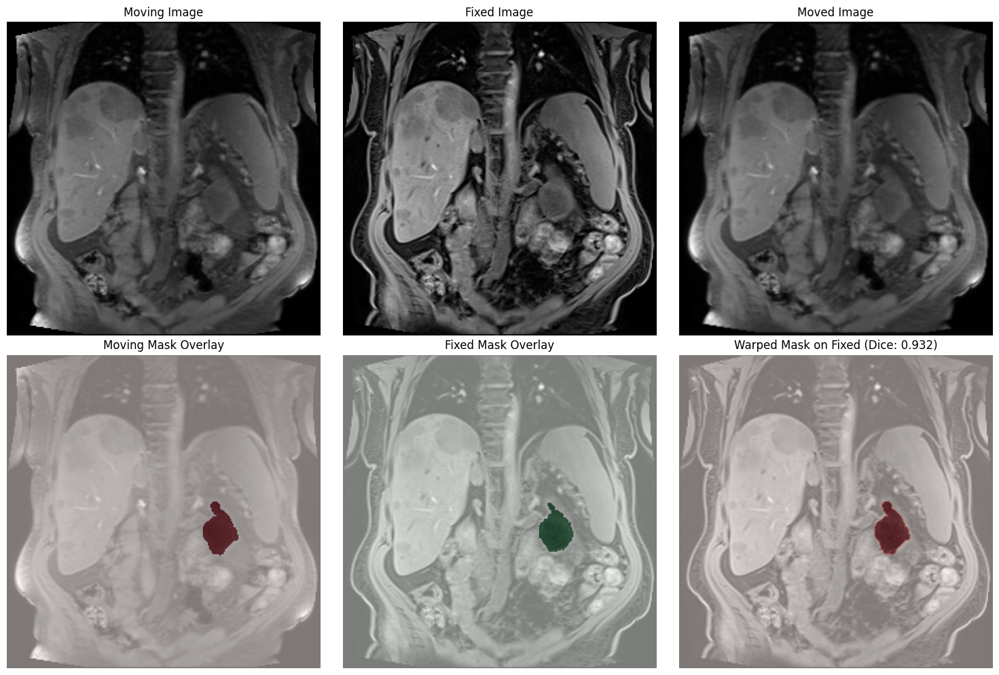

Dice Score Before Registration: 0.9403
Dice Score After Registration:  0.9417


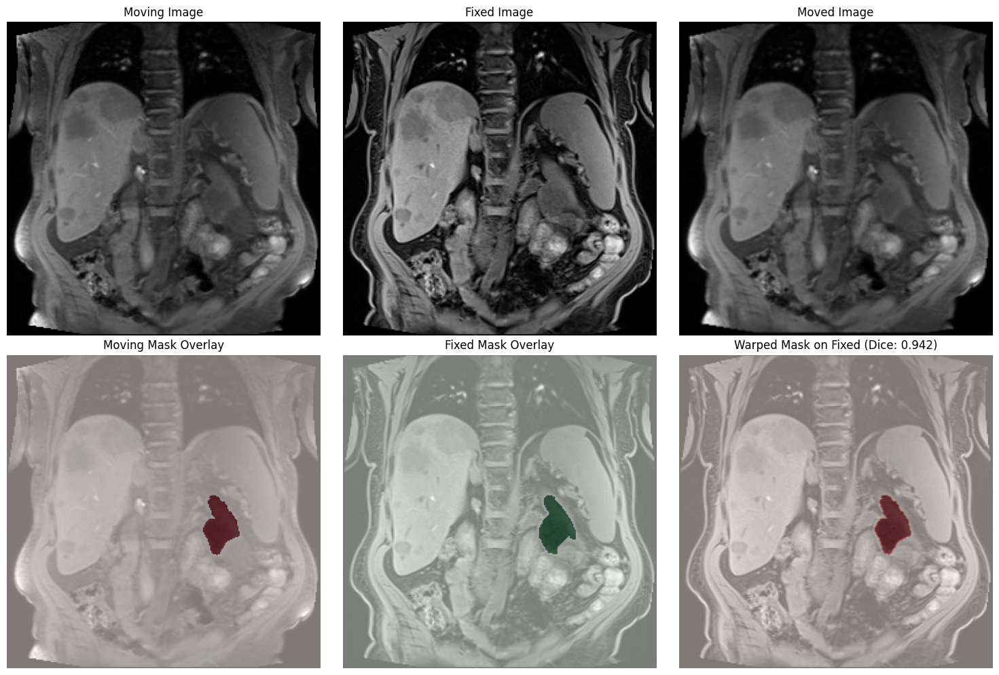

Dice Score Before Registration: 0.8791
Dice Score After Registration:  0.8783


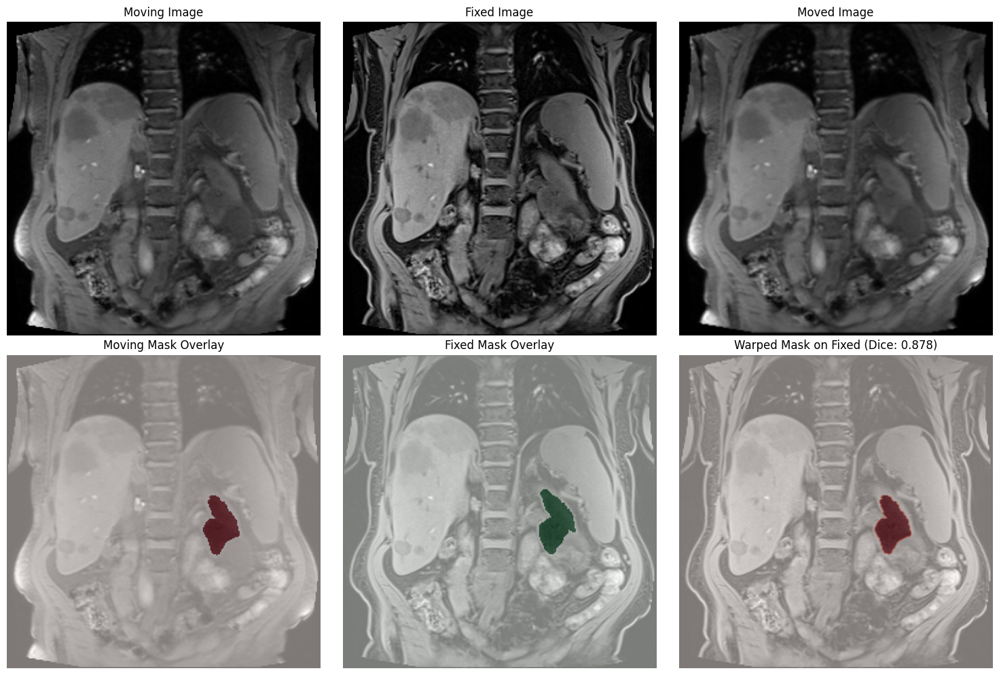

Dice Score Before Registration: 0.8550
Dice Score After Registration:  0.8542


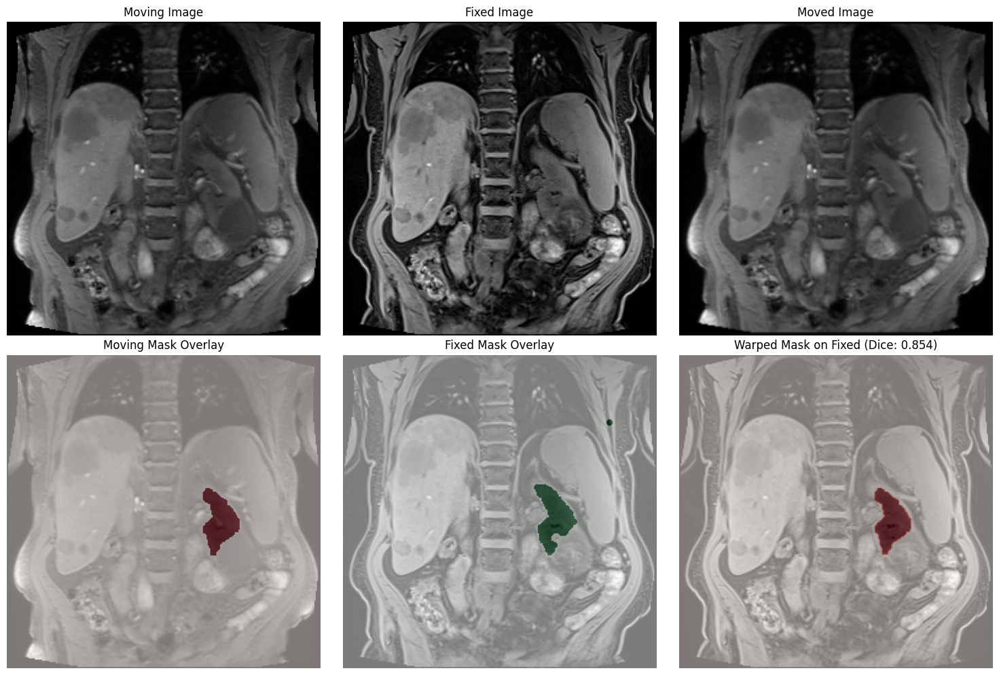

Dice Score Before Registration: 0.8343
Dice Score After Registration:  0.8303


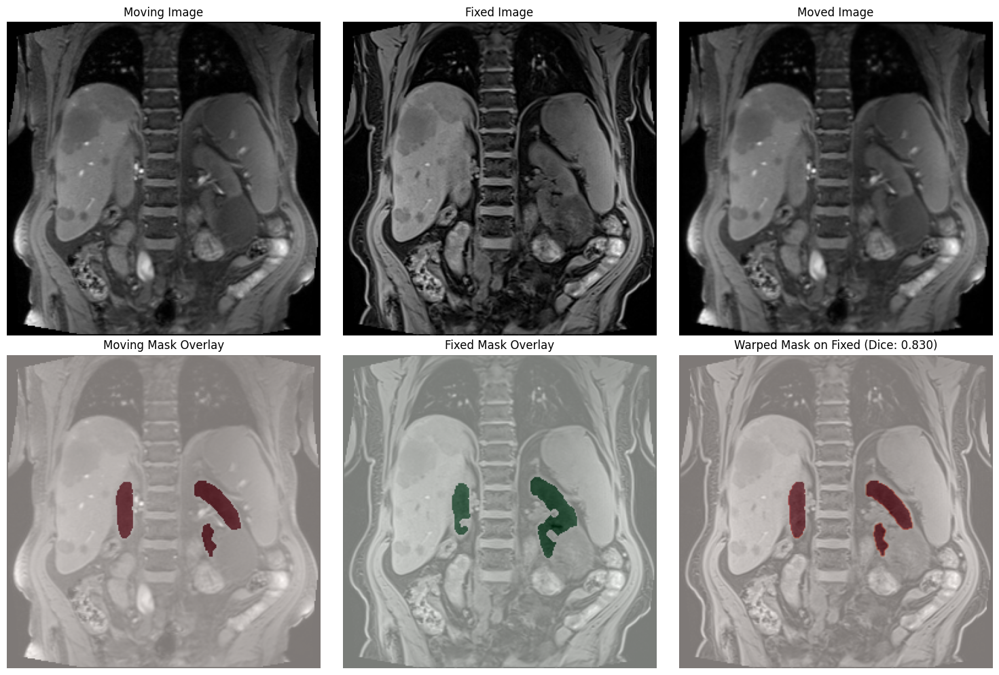

Dice Score Before Registration: 0.8828
Dice Score After Registration:  0.8759


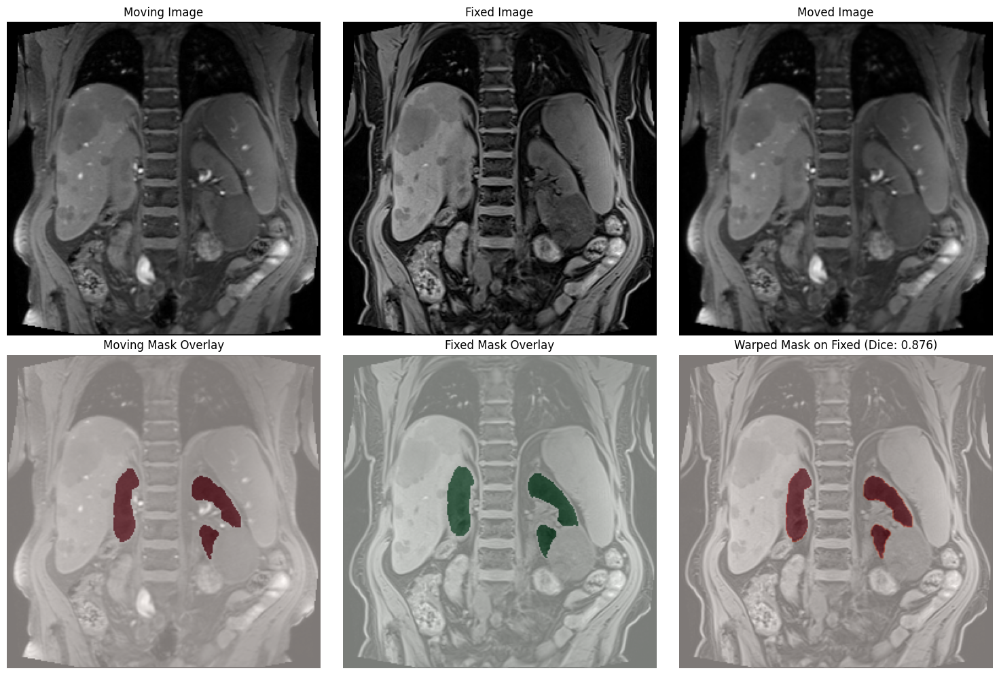

Dice Score Before Registration: 0.8810
Dice Score After Registration:  0.8774


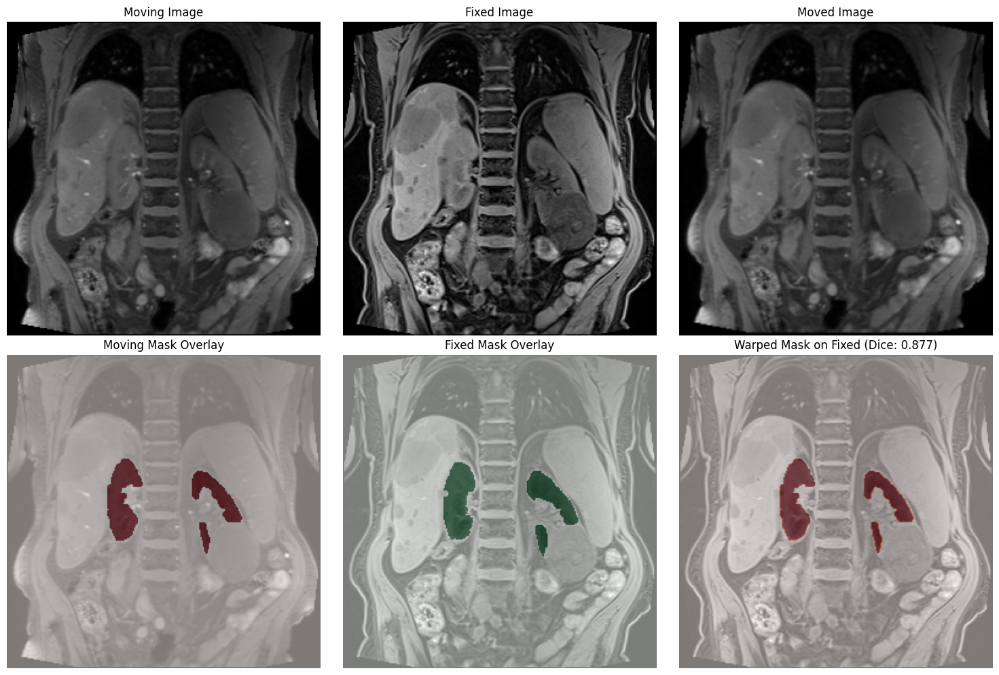

Dice Score Before Registration: 0.8641
Dice Score After Registration:  0.8613


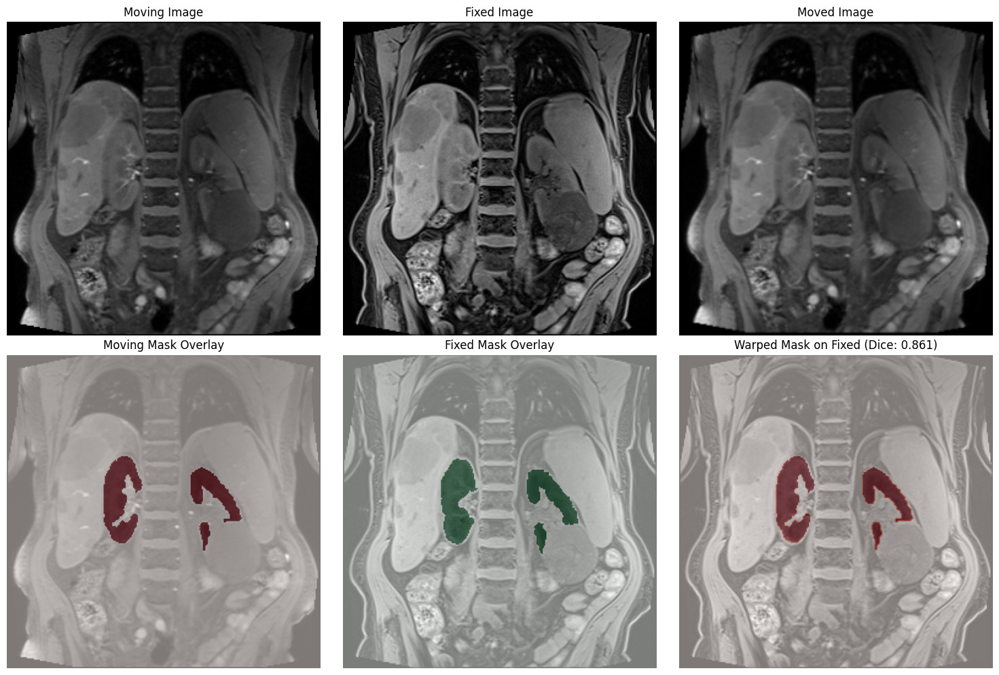

Dice Score Before Registration: 0.8936
Dice Score After Registration:  0.8913


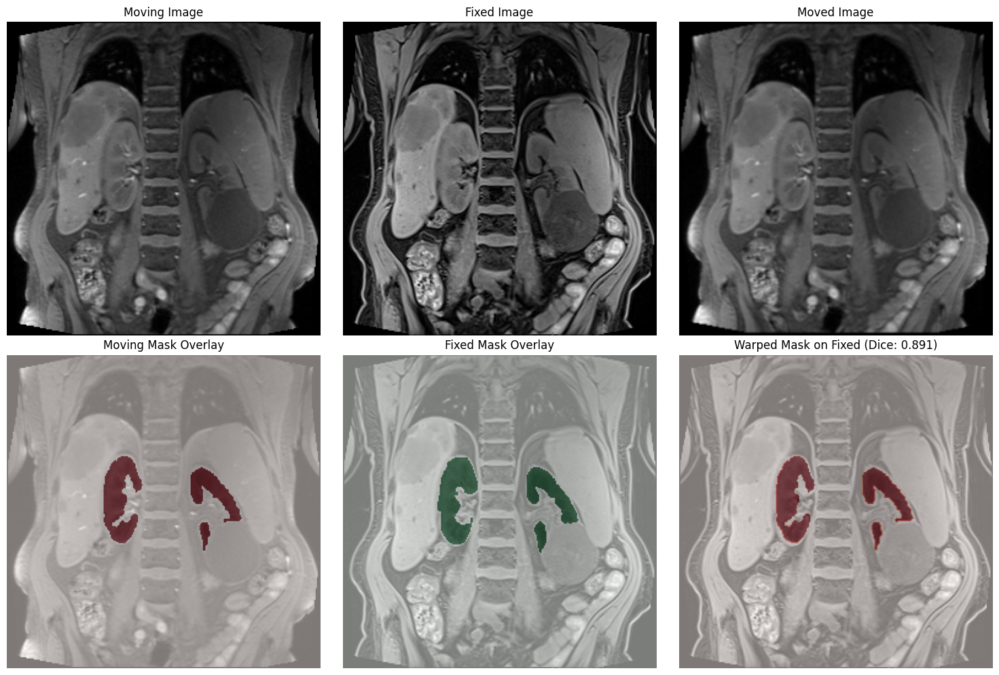

Dice Score Before Registration: 0.8946
Dice Score After Registration:  0.8901


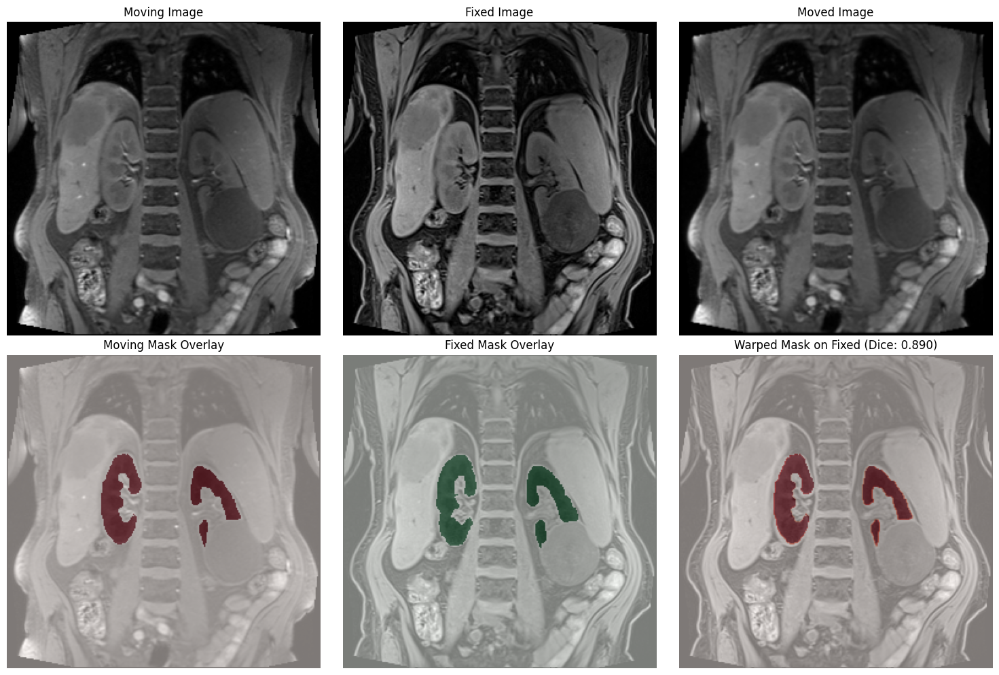

In [13]:
for index in range(10):
    evaluate_pair(model_def, moving_img[index], fixed_img[index], moving_mask[index], fixed_mask[index], device)

In [31]:
# evaluate dice score on all test images
dice_scores_before = []
dice_scores_after = []
for index in range(len(moving_img)):
    dice_before, dice_after = calculate_dice_scores(model_def, moving_img[index], fixed_img[index], moving_mask[index], fixed_mask[index], device)
    dice_scores_before.append(dice_before)
    dice_scores_after.append(dice_after)

print(f"Average Dice Before Registration: {np.mean(dice_scores_before):.4f}")
print(f"Average Dice After Registration:  {np.mean(dice_scores_after):.4f}")

Average Dice Before Registration: 0.8291
Average Dice After Registration:  0.8240


## Load model

In [34]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
model_path = "/home/students/studweilc1/MU-Diff/results/synthmorph/models/model.pth"

in_shape = (256, 256)
nb_unet_features = ([256] * 4, [256] * 8)

# --- Load Model ---
model = VxmDense(in_shape, nb_unet_features, int_steps=7, int_resolution=2).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print(f"Loaded model from {model_path}")


Using device: cpu
Loaded model from /home/students/studweilc1/MU-Diff/results/synthmorph/models/model.pth


In [58]:
def load_and_conform2(x, in_shape=(256, 256), is_mask=False):
    """
    Conforms it to the required shape, and converts it to a tensor.
    """

    # For masks, we want to ensure the values are binary (0 or 1)
    if is_mask:
        x[x > 0] = 1

    # Normalize image intensities to [0, 1]
    if not is_mask:
        x = (x - x.min()) / (x.max() - x.min())
    
    # Add batch and channel dimensions and convert to tensor
    return torch.from_numpy(x).unsqueeze(0).unsqueeze(0).float()

In [66]:
target_path = "../data/my_data2/test/DIXON.npy"
target_masks_path = "../data/my_data2/test/DIXON_masks.npy"

moving_path = "../data/my_data2/test/T1_mapping_fl2d.npy"
moving_masks_path = "../data/my_data2/test/T1_mapping_fl2d_masks.npy"

# Load the numpy arrays
moving_imgs = np.load(moving_path)
fixed_imgs = np.load(target_path)
moving_masks = np.load(moving_masks_path)
fixed_masks = np.load(target_masks_path)

def dice_coefficient_numpy(y_true, y_pred, smooth=1e-6):
    y_true_f = np.reshape(y_true, [-1])
    y_pred_f = np.reshape(y_pred, [-1])
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)


def calculate_dice(model_def, moving_img, fixed_img, moving_mask, fixed_mask, device='cpu'):
    """
    Calculates the Dice Similarity Coefficient for binary masks.
    """
    # --- 1. Set model to evaluation mode ---
    model_def.eval()
    
    # --- 2. Load and conform data ---
    moving_image = load_and_conform2(moving_img).to(device)
    fixed_image = load_and_conform2(fixed_img).to(device)
    moving_mask = load_and_conform2(moving_mask, is_mask=True).to(device)
    fixed_mask = load_and_conform2(fixed_mask, is_mask=True).to(device)

    # --- 3. Run inference to get the warp field ---
    with torch.no_grad():
        moved_image, warp = model_def(moving_image, fixed_image)

    # --- 4. Apply the SAME warp to the moving mask ---
    # Use 'nearest' interpolation for masks to keep values discrete (0s and 1s)
    transform_layer = SpatialTransformer(moving_mask.shape[2:], interpolation_mode='bilinear').to(device)
    warped_mask = transform_layer(moving_mask, warp)

    # --- 5. Calculate Dice Score ---
    dice_before = dice_coefficient_numpy(moving_mask.cpu().numpy(), fixed_mask.cpu().numpy())
    dice_after = dice_coefficient_numpy(warped_mask.cpu().numpy(), fixed_mask.cpu().numpy())

    return dice_before, dice_after

def calculate_all_dice_scores(model_def, fixed_imgs, moving_imgs, fixed_masks, moving_masks):
    dice_scores = []
    dice_scores_warped = []
    for i in tqdm.tqdm(range(len(fixed_imgs))):
        dice_score, dice_score_warped = calculate_dice(model_def, moving_imgs[i], fixed_imgs[i], moving_masks[i], fixed_masks[i])
        dice_scores.append(dice_score)
        dice_scores_warped.append(dice_score_warped)
    return dice_scores, dice_scores_warped

In [64]:

# --- Load and Conform Data ---
index = 0
moving_image = load_and_conform2(moving_imgs[index]).to(device)
fixed_image = load_and_conform2(fixed_imgs[index]).to(device)
moving_mask = load_and_conform2(moving_masks[index], is_mask=True).to(device)
fixed_mask = load_and_conform2(fixed_masks[index], is_mask=True).to(device)

# --- Run Inference ---
with torch.no_grad():
    moved_image, warp = model(moving_image, fixed_image)

transform_layer = SpatialTransformer(in_shape, interpolation_mode='nearest').to(device)
warped_mask = transform_layer(moving_mask, warp)

# --- Calculate and Print Dice ---
dice_before = calculate_dice_score(moving_mask, fixed_mask)
dice_after = calculate_dice_score(warped_mask, fixed_mask)
print(f"\nDice Score Before Registration: {dice_before:.4f}")
print(f"Dice Score After Registration:  {dice_after:.4f}")


Dice Score Before Registration: 0.9276
Dice Score After Registration:  0.8959


In [67]:
dice_scores, dice_scores_warped = calculate_all_dice_scores(model, fixed_imgs, moving_imgs, fixed_masks, moving_masks)

100%|██████████| 102/102 [01:43<00:00,  1.02s/it]


In [68]:
np.mean(dice_scores), np.mean(dice_scores_warped)

(np.float32(0.81358045), np.float32(0.78207475))